# Glass Detection v1.6.2 - Isolated Gaussian Peak Detection

## Overview
This notebook implements gravity-aligned glass detection using isolated Gaussian peak detection.
The pipeline transforms point clouds to a gravity-aligned coordinate system before creating 2D intensity images.

## Detection Pipeline

1. **SLAM Transformation** - Transform to world frame using calibrated poses
2. **Gravity Alignment** - Estimate ground plane and align coordinate system to gravity
3. **2D Projection** - Create continuous intensity images from gravity-aligned sensor frames
4. **Gaussian Smoothing** - Smooth intensity surface to reveal Gaussian-shaped peaks
5. **Peak Detection** - Find local maxima in valid intensity range
6. **Adaptive Radial Verification** - Verify peaks are isolated using 16-direction checks
7. **Watershed Segmentation** - Capture full spatial extent of each peak
8. **Spatial + Size Filtering** - Exclude extreme angles and invalid region sizes

## Setup

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from dataclasses import dataclass
from typing import Dict, Tuple, List, Optional
from scipy.spatial.transform import Rotation
from scipy.ndimage import gaussian_filter
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from collections import defaultdict
import cv2
import open3d as o3d

DATA_FOLDER = Path("/Volumes/Hemanth SSD/sample_data")

## Configuration

In [42]:
@dataclass
class AlignmentConfig:
    """Configuration for gravity alignment."""
    bottom_rings_count: int = 20
    ransac_dist_thresh: float = 0.05
    ransac_n: int = 3
    ransac_iters: int = 1000

@dataclass
class ImageConfig:
    """Configuration for intensity image creation.
    
    Attributes:
        AZIMUTH_WIDTH: Horizontal resolution of intensity images (pixels)
        NORMALIZATION_METHOD: Method for intensity normalization ('robust_min_max')
        FIRST_RETURN_ONLY: Whether to use only first returns from LiDAR
    """
    AZIMUTH_WIDTH: int = 480
    NORMALIZATION_METHOD: str = 'robust_min_max'
    FIRST_RETURN_ONLY: bool = True

@dataclass
class DetectorConfig:
    """Configuration for glass detector.
    
    Attributes:
        smooth_sigma: Gaussian smoothing sigma for surface smoothing
        min_distance: Minimum distance between detected peaks (pixels)
        prominence_percentile: Minimum intensity percentile for peak detection
        max_brightness_percentile: Maximum intensity percentile (excludes very bright peaks)
        isolation_percentile: Intensity percentile threshold for isolation verification
        radius_scale: Scale factor for adaptive search radius (radius = intensity * scale)
        min_radius: Minimum search radius for isolation verification (pixels)
        max_radius: Maximum search radius for isolation verification (pixels)
        min_directions: Minimum number of directions that must pass isolation check (out of 16)
        distance_std_threshold: Maximum coefficient of variation for distance consistency
        min_peak_size: Minimum watershed region size (pixels)
        max_peak_size: Maximum watershed region size (pixels)
        exclude_top_fraction: Fraction of image top to exclude (extreme angles)
        exclude_bottom_fraction: Fraction of image bottom to exclude (extreme angles)
    """
    # Smoothing
    smooth_sigma: float = 2.5
    
    # Peak detection
    min_distance: int = 5
    prominence_percentile: float = 40
    max_brightness_percentile: float = 90
    
    # Isolation verification
    isolation_percentile: float = 20
    radius_scale: float = 0.5
    min_radius: int = 10
    max_radius: int = 100
    min_directions: int = 8
    distance_std_threshold: float = 0.4
    
    # Region filtering
    min_peak_size: int = 50
    max_peak_size: int = 3000
    exclude_top_fraction: float = 0.1
    exclude_bottom_fraction: float = 0.1

img_config = ImageConfig()
det_config = DetectorConfig()
align_config = AlignmentConfig()

## Data Structures

In [43]:
@dataclass
class PointCloudData:
    """Container for LiDAR point cloud data.
    
    Attributes:
        sensor_name: Name of the sensor ('hesai' or 'ouster')
        timestamp: Timestamp of the point cloud
        points_raw: Raw 3D points in sensor frame (N x 3)
        intensities: Intensity values for each point (N,)
        rings: Ring index for each point (N,)
        labels: Ground truth labels for each point (N,) - 2=glass
        num_rings: Total number of rings in this sensor
        pose_R: Rotation matrix from sensor to world frame (3 x 3)
        pose_T: Translation vector from sensor to world frame (3,)
        points_world: Points in world/SLAM frame (N x 3)
        points_aligned: Points in gravity-aligned frame (N x 3)
    """
    sensor_name: str
    timestamp: float
    points_raw: np.ndarray
    intensities: np.ndarray
    rings: np.ndarray
    labels: np.ndarray
    num_rings: int
    pose_R: Optional[np.ndarray] = None
    pose_T: Optional[np.ndarray] = None
    points_world: Optional[np.ndarray] = None
    points_aligned: Optional[np.ndarray] = None

@dataclass
class IntensityImage:
    """Container for 2D intensity image and point-to-pixel mapping.
    
    Attributes:
        image: 2D intensity image (H x W)
        point_to_pixel: Mapping from 3D points to 2D pixels
            - 'row_indices': Row index for each point
            - 'col_indices': Column index for each point
            - 'valid_mask': Boolean mask for valid points
    """
    image: np.ndarray
    point_to_pixel: Dict
    
    @property
    def shape(self):
        """Get shape of intensity image."""
        return self.image.shape

## Data Loading

In [44]:
class DataLoader:
    """Loads LiDAR point clouds, RGB images, and applies SLAM transformation."""
    
    def __init__(self, data_folder: Path, config: ImageConfig):
        self.data_folder = Path(data_folder)
        self.config = config
        # Load pose files
        self.poses = {
            'hesai': self._load_poses('hesai_pose.txt'),
            'ouster': self._load_poses('ouster_pose.txt')
        }
    
    def _load_poses(self, filename: str) -> np.ndarray:
        pose_file = self.data_folder / filename
        if not pose_file.exists():
            print(f"Warning: Pose file not found: {pose_file}")
            return np.array([])
        return np.loadtxt(pose_file)
    
    @staticmethod
    def _load_ply(filepath: Path) -> np.ndarray:
        with open(filepath, 'r') as f:
            while f.readline().strip() != 'end_header': pass
            return np.loadtxt(f)
    
    def load_point_cloud(self, sensor: str, ply_file: Path) -> PointCloudData:
        timestamp = float(ply_file.stem)
        data = self._load_ply(ply_file)
        
        points_raw = data[:, :3]
        intensities = data[:, 6]
        rings = data[:, 7].astype(int)
        returns = data[:, 8].astype(int)
        labels = data[:, 9].astype(int)
        
        if self.config.FIRST_RETURN_ONLY:
            mask = (returns == 1)
            points_raw = points_raw[mask]
            intensities = intensities[mask]
            rings = rings[mask]
            labels = labels[mask]
        
        # Transform to world frame
        points_world = points_raw.copy()
        pose_R, pose_T = None, None
        if sensor in self.poses and len(self.poses[sensor]) > 0:
            poses = self.poses[sensor]
            idx = np.argmin(np.abs(poses[:, 0] - timestamp))
            pose = poses[idx]
            pose_T = pose[1:4]
            pose_R = Rotation.from_quat(pose[4:8]).as_matrix()
            points_world = (pose_R @ points_raw.T).T + pose_T
        
        return PointCloudData(
            sensor_name=sensor,
            timestamp=timestamp,
            points_raw=points_raw,
            intensities=intensities,
            rings=rings,
            labels=labels,
            num_rings=int(np.max(rings)) + 1,
            pose_R=pose_R,
            pose_T=pose_T,
            points_world=points_world
        )
    
    def get_all_rgb_files(self) -> List[Tuple[float, Path]]:
        rgb_dir = self.data_folder / 'images'
        if not rgb_dir.exists(): return []
        rgb_files = []
        for ext in ['*.jpg', '*.png']:
            for img_file in sorted(rgb_dir.glob(ext)):
                if img_file.name.startswith('._'): continue
                try:
                    timestamp = float(img_file.stem)
                    rgb_files.append((timestamp, img_file))
                except ValueError: continue
        return rgb_files
    
    def load_rgb_image(self, rgb_path: Path) -> np.ndarray:
        if rgb_path.exists():
            return cv2.cvtColor(cv2.imread(str(rgb_path)), cv2.COLOR_BGR2RGB)
        return None
    
    def find_closest_point_clouds(self, rgb_timestamp: float) -> Dict[str, PointCloudData]:
        point_clouds = {}
        for sensor in ['hesai', 'ouster']:
            sensor_dir = self.data_folder / sensor
            if not sensor_dir.exists(): continue
            ply_files = [f for f in sorted(sensor_dir.glob('*.ply')) if not f.name.startswith('._')]
            if not ply_files: continue
            timestamps = [float(f.stem) for f in ply_files]
            closest_idx = np.argmin(np.abs(np.array(timestamps) - rgb_timestamp))
            try:
                point_clouds[sensor] = self.load_point_cloud(sensor, ply_files[closest_idx])
            except Exception as e:
                print(f"Failed to load {ply_files[closest_idx].name}: {e}")
        return point_clouds
    
    def load_all_by_rgb(self) -> Dict[float, Dict]:
        data = {}
        rgb_files = self.get_all_rgb_files()
        print(f"Found {len(rgb_files)} RGB images")
        for rgb_ts, rgb_path in rgb_files:
            rgb_img = self.load_rgb_image(rgb_path)
            if rgb_img is None:
                print(f"  ✗ Failed to load RGB image: {rgb_path.name}")
                continue
            point_clouds = self.find_closest_point_clouds(rgb_ts)
            if not point_clouds:
                print(f"  ✗ No point clouds found for RGB timestamp: {rgb_ts}")
                continue
            data[rgb_ts] = {'rgb': rgb_img, 'point_clouds': point_clouds}
            print(f"  ✓ Loaded RGB {rgb_ts} with {len(point_clouds)} LiDAR sensors")
        return data

## Gravity Alignment

In [45]:
class GravityAligner:
    """Estimates ground plane and computes gravity alignment rotation.
    
    Uses RANSAC plane fitting on bottom rings of world-frame points to estimate
    the ground plane, then computes a rotation matrix to align the ground normal
    with the Z-axis (gravity direction).
    """
    
    def __init__(self, config: AlignmentConfig):
        self.cfg = config
    
    def estimate_ground_plane(self, pcs: List[PointCloudData]) -> Tuple[np.ndarray, float]:
        """Estimate ground plane from bottom rings of world-frame points."""
        candidates = []
        for pc in pcs:
            if pc.points_world is None: continue
            u_rings = np.unique(pc.rings)
            sorted_r = np.sort(u_rings)
            target_r = sorted_r[:self.cfg.bottom_rings_count]
            mask = np.isin(pc.rings, target_r)
            candidates.append(pc.points_world[mask])
        
        if not candidates: return None, 0.0
        points = np.vstack(candidates)
        
        # RANSAC plane fitting
        pcd = o3d.geometry.PointCloud()
        pcd.points = o3d.utility.Vector3dVector(points)
        plane, inliers = pcd.segment_plane(
            distance_threshold=self.cfg.ransac_dist_thresh,
            ransac_n=self.cfg.ransac_n,
            num_iterations=self.cfg.ransac_iters
        )
        return plane, len(inliers)/len(points)
    
    def compute_gravity_rotation(self, plane: np.ndarray) -> np.ndarray:
        """Compute rotation to align plane normal with [0,0,1]."""
        a, b, c, d = plane
        normal = np.array([a, b, c])
        normal /= np.linalg.norm(normal)
        
        # Ensure normal points up
        target = np.array([0, 0, 1])
        if np.dot(normal, target) < 0:
            normal = -normal
        
        # Compute rotation
        v = np.cross(normal, target)
        c_val = np.dot(normal, target)
        s = np.linalg.norm(v)
        
        if s < 1e-6: return np.eye(3)
        
        K = np.array([[0, -v[2], v[1]],
                      [v[2], 0, -v[0]],
                      [-v[1], v[0], 0]])
        R = np.eye(3) + K + K @ K * ((1 - c_val) / (s**2))
        return R
    
    def align_point_clouds(self, pcs: List[PointCloudData], R_gravity: np.ndarray):
        """Apply gravity alignment to sensor-frame points.
        
        For each sensor, compute R_total = R_gravity @ R_pose,
        then apply to raw points: P_aligned = R_total @ P_raw
        """
        for pc in pcs:
            if pc.pose_R is not None:
                R_total = R_gravity @ pc.pose_R
                pc.points_aligned = (R_total @ pc.points_raw.T).T
            else:
                # No pose, just apply gravity rotation to raw
                pc.points_aligned = (R_gravity @ pc.points_raw.T).T

## Intensity Image Creation

In [46]:
class IntensityImageCreator:
    """Creates 2D intensity images from 3D point clouds.
    
    Converts LiDAR point clouds to 2D intensity images using ring and azimuth
    information. Applies robust normalization and handles sensor-specific
    orientation (Ouster images are flipped vertically).
    """
    
    def __init__(self, config: ImageConfig):
        """Initialize image creator.
        
        Args:
            config: Image configuration
        """
        self.config = config
    
    def create(self, pc: PointCloudData) -> IntensityImage:
        """Create 2D intensity image from point cloud.
        
        Process:
        1. Normalize intensities using robust min-max (2nd-98th percentile)
        2. Calculate azimuth angles from gravity-aligned points
        3. Apply gap-aware azimuth mapping (finds largest gap, unwraps angles)
        4. Use ring indices as row indices (flipped for Ouster)
        5. Map points to pixels (last point wins for overlaps)
        Args:
            pc: Point cloud data
            
        Returns:
            IntensityImage with 2D image and point-to-pixel mapping
        """
        H, W = pc.num_rings, self.config.AZIMUTH_WIDTH
        intensities = pc.intensities.copy()
        
        # Robust normalization to handle outliers
        if self.config.NORMALIZATION_METHOD == 'robust_min_max':
            p2, p98 = np.percentile(intensities, (2, 98))
            intensities = np.clip(intensities, p2, p98)
            if p98 > p2:
                intensities = (intensities - p2) / (p98 - p2) * 255.0
        
        # Create empty image
        img = np.zeros((H, W), dtype=np.float32)
        
        # Calculate column indices from azimuth angles
        # Use gravity-aligned points for projection
        points = pc.points_aligned if pc.points_aligned is not None else pc.points_raw
        azimuths = np.arctan2(points[:, 1], points[:, 0])  # Range: [-pi, pi]
        
        # Find the largest gap in azimuth coverage to determine where to 'cut'
        # Sort azimuths and find gaps between consecutive points
        sorted_az = np.sort(azimuths)
        gaps = np.diff(sorted_az)
        max_gap_idx = np.argmax(gaps)
        
        # The cut point is in the middle of the largest gap
        cut_point = (sorted_az[max_gap_idx] + sorted_az[max_gap_idx + 1]) / 2
        
        # Unwrap azimuths: shift angles so the gap is at the edges
        azimuths_unwrapped = azimuths.copy()
        azimuths_unwrapped[azimuths < cut_point] += 2 * np.pi
        
        # Now map the continuous range to image width
        az_min = np.min(azimuths_unwrapped)
        az_max = np.max(azimuths_unwrapped)
        az_range = az_max - az_min
        
        if az_range > 0:
            col_indices = np.clip(
                W - 1 - np.round(((azimuths_unwrapped - az_min) / az_range) * (W - 1)).astype(int),
                0, W - 1
            )
        else:
            col_indices = np.zeros(len(azimuths), dtype=int)
        # Calculate row indices from rings (flip Ouster to match orientation)
        if pc.sensor_name.lower() == 'ouster':
            row_indices = H - 1 - pc.rings
        else:
            row_indices = pc.rings
        
        valid_mask = (row_indices >= 0) & (row_indices < H)
        
        # Assign intensities to pixels
        img[row_indices[valid_mask], col_indices[valid_mask]] = intensities[valid_mask]
        
        return IntensityImage(
            image=img,
            point_to_pixel={
                'row_indices': row_indices,
                'col_indices': col_indices,
                'valid_mask': valid_mask
            }
        )

## Glass Detector

In [47]:
class GlassDetector:
    """Detects glass using isolated Gaussian peak detection.
    
    Detection pipeline:
    1. Smooth intensity surface with Gaussian filter
    2. Find local maxima in valid intensity range (70-90 percentile)
    3. Verify peaks are isolated using adaptive radial check in 16 directions
    4. Segment peaks using watershed
    5. Filter regions by size and spatial position
    
    Glass appears as isolated Gaussian-shaped intensity peaks surrounded
    by low/zero intensity regions (no LiDAR returns through glass).
    """
    
    def __init__(self, config: DetectorConfig):
        """Initialize glass detector.
        
        Args:
            config: Detector configuration
        """
        self.config = config
        # Pre-compute 16 evenly-spaced directions (every 22.5 degrees)
        self.directions = [
            (-np.cos(angle), np.sin(angle))
            for angle in np.linspace(0, 2*np.pi, 16, endpoint=False)
        ]
    
    def _smooth(self, image: np.ndarray) -> np.ndarray:
        """Apply Gaussian smoothing to intensity image.
        
        Args:
            image: Input intensity image
            
        Returns:
            Smoothed intensity image
        """
        return gaussian_filter(image, sigma=self.config.smooth_sigma)
    
    def _find_peaks(self, smoothed: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        """Find local maxima in valid intensity range.
        
        Finds peaks above prominence threshold but below max brightness
        (excludes very bright peaks which are likely walls).
        
        Args:
            smoothed: Smoothed intensity image
            
        Returns:
            Tuple of (all_peaks, brightness_filtered_peaks) as (N x 2) arrays
        """
        min_thresh = np.percentile(smoothed[smoothed > 0], self.config.prominence_percentile)
        max_thresh = np.percentile(smoothed[smoothed > 0], self.config.max_brightness_percentile)
        
        all_peaks = peak_local_max(
            smoothed,
            min_distance=self.config.min_distance,
            threshold_abs=min_thresh,
            exclude_border=True
        )
        
        # Filter out peaks that are too bright
        filtered = [p for p in all_peaks if smoothed[p[0], p[1]] <= max_thresh]
        return all_peaks, np.array(filtered) if filtered else np.array([]).reshape(0, 2)
    
    def _verify_isolation(self, smoothed: np.ndarray, peak_r: int, peak_c: int) -> bool:
        """Verify peak is isolated using adaptive radial check.
        
        Checks if intensity drops to low values in most directions around peak.
        Uses adaptive search radius proportional to peak intensity.
        Also verifies distance consistency across directions.
        
        Args:
            smoothed: Smoothed intensity image
            peak_r: Peak row index
            peak_c: Peak column index
            
        Returns:
            True if peak is isolated, False otherwise
        """
        H, W = smoothed.shape
        peak_intensity = smoothed[peak_r, peak_c]
        
        # Adaptive radius: higher peaks get larger search radius
        radius = int(np.clip(
            peak_intensity * self.config.radius_scale,
            self.config.min_radius,
            self.config.max_radius
        ))
        
        iso_thresh = np.percentile(smoothed[smoothed > 0], self.config.isolation_percentile)
        
        directions_passed = 0
        distances = []
        
        # Check each of 16 directions
        for dr, dc in self.directions:
            for step in range(1, radius + 1):
                r, c = int(peak_r + dr * step), int(peak_c + dc * step)
                if r < 0 or r >= H or c < 0 or c >= W:
                    break
                if smoothed[r, c] < iso_thresh:
                    directions_passed += 1
                    distances.append(step)
                    break
        
        # Check if enough directions passed
        if directions_passed < self.config.min_directions:
            return False
        
        # Check distance consistency (coefficient of variation)
        if len(distances) > 0:
            cv = np.std(distances) / np.mean(distances) if np.mean(distances) > 0 else 1.0
            return cv < self.config.distance_std_threshold
        
        return False
    
    def _segment_peaks(self, smoothed: np.ndarray, peaks: np.ndarray) -> np.ndarray:
        """Segment peaks using watershed algorithm.
        
        Treats smoothed image as topographic surface and floods from peak
        locations to capture full extent of each peak.
        
        Args:
            smoothed: Smoothed intensity image
            peaks: Peak locations (N x 2)
            
        Returns:
            Label image where each region has unique ID (0 = background)
        """
        if len(peaks) == 0:
            return np.zeros_like(smoothed, dtype=int)
        
        markers = np.zeros_like(smoothed, dtype=int)
        for i, (r, c) in enumerate(peaks):
            markers[r, c] = i + 1
        
        return watershed(-smoothed, markers, mask=smoothed > 0)
    
    def _filter_regions(self, labels: np.ndarray, H: int) -> Tuple[np.ndarray, int]:
        """Filter watershed regions by size and spatial position.
        
        Removes regions that are:
        - Too small or too large (noise or large objects)
        - In top/bottom 10% of image (extreme angles, no perpendicular incidence)
        
        Args:
            labels: Watershed label image
            H: Image height
            
        Returns:
            Tuple of (glass_mask, num_filtered_by_position)
        """
        glass_mask = np.zeros_like(labels, dtype=bool)
        top_cut = int(H * self.config.exclude_top_fraction)
        bottom_cut = int(H * (1 - self.config.exclude_bottom_fraction))
        filtered_count = 0
        
        for region_id in range(1, np.max(labels) + 1):
            region = (labels == region_id)
            size = np.sum(region)
            
            # Size filter
            if not (self.config.min_peak_size <= size <= self.config.max_peak_size):
                continue
            
            # Position filter
            rows = np.where(region)[0]
            if np.any(rows < top_cut) or np.any(rows >= bottom_cut):
                filtered_count += 1
                continue
            
            glass_mask[region] = True
        
        return glass_mask, filtered_count
    
    def detect(self, img: IntensityImage) -> Tuple[np.ndarray, np.ndarray, int, int]:
        """Run full glass detection pipeline.
        
        Args:
            img: Intensity image
            
        Returns:
            Tuple of:
                - glass_mask: Binary mask of detected glass (H x W)
                - isolated_peaks: Locations of isolated peaks (N x 2)
                - n_peaks: Total number of peaks found
                - n_filtered: Number of regions filtered by position
        """
        smoothed = self._smooth(img.image)
        all_peaks, brightness_filtered = self._find_peaks(smoothed)
        
        # Verify isolation for each peak
        isolated = [p for p in brightness_filtered if self._verify_isolation(smoothed, p[0], p[1])]
        isolated_peaks = np.array(isolated) if isolated else np.array([]).reshape(0, 2)
        
        # Segment and filter
        labels = self._segment_peaks(smoothed, isolated_peaks)
        glass_mask, pos_filtered = self._filter_regions(labels, img.shape[0])
        
        return glass_mask, isolated_peaks, len(all_peaks), pos_filtered

## Utilities

In [48]:
def create_ground_truth(img: IntensityImage, pc: PointCloudData) -> np.ndarray:
    """Create ground truth mask from point cloud labels.
    
    Maps 3D point labels to 2D image pixels. Label 2 indicates glass.
    
    Args:
        img: Intensity image with point-to-pixel mapping
        pc: Point cloud with ground truth labels
        
    Returns:
        Binary ground truth mask (H x W) where True = glass
    """
    H, W = img.shape
    gt = np.zeros((H, W), dtype=bool)
    
    mapping = img.point_to_pixel
    rows = mapping['row_indices'][mapping['valid_mask']]
    cols = mapping['col_indices'][mapping['valid_mask']]
    labels = pc.labels[mapping['valid_mask']]
    
    for r, c, l in zip(rows, cols, labels):
        if l == 2 and 0 <= r < H and 0 <= c < W:
            gt[r, c] = True
    
    return gt

## Visualization

In [49]:
def visualize_results(rgb_timestamp: float, sensor: str, lidar_timestamp: float,
                     img: IntensityImage, detected: np.ndarray, gt: np.ndarray,
                     isolated_peaks: np.ndarray, rgb: np.ndarray, n_peaks: int, n_filtered: int):
    """Visualize detection results with 3-panel layout.
    
    Panel 1: Intensity image
    Panel 2: Detection overlay with ground truth
        - Yellow: Correct detection (true positive)
        - Red: False positive
        - Green: Missed detection (false negative)
        - Cyan circles: Isolated peaks
    Panel 3: RGB image
    
    Args:
        rgb_timestamp: RGB image timestamp
        sensor: Sensor name
        lidar_timestamp: LiDAR timestamp
        img: Intensity image
        detected: Detection mask
        gt: Ground truth mask
        isolated_peaks: Peak locations
        rgb: RGB image
        n_peaks: Total peaks found
        n_filtered: Peaks filtered by position
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # Panel 1: Intensity image
    axes[0].imshow(img.image, aspect='auto', cmap='hot', origin='lower')
    axes[0].set_title(f"{sensor.upper()} - Intensity Image")
    axes[0].axis('off')
    
    # Panel 2: Detection overlay
    overlay = np.stack([img.image]*3, axis=-1)
    overlay = overlay / np.max(overlay) if np.max(overlay) > 0 else overlay
    
    overlay[detected & ~gt] = [1.0, 0, 0]  # Red: false positive
    overlay[~detected & gt] = [0, 1.0, 0]  # Green: false negative
    overlay[detected & gt] = [1.0, 1.0, 0]  # Yellow: true positive
    
    axes[1].imshow(overlay, aspect='auto', origin='lower')
    if len(isolated_peaks) > 0:
        axes[1].scatter(isolated_peaks[:, 1], isolated_peaks[:, 0], 
                       edgecolors='cyan', s=100, marker='o', linewidths=2, facecolors='none')
    axes[1].set_title(f"Detection + GT (Yellow=Match, Red=FP, Green=FN)\nPeaks: {n_peaks}→{len(isolated_peaks)} | Filtered: {n_filtered}")
    axes[1].axis('off')
    
    # Panel 3: RGB image
    axes[2].imshow(rgb)
    axes[2].set_title("RGB Image")
    axes[2].axis('off')
    
    plt.suptitle(f"RGB Time: {rgb_timestamp:.3f} | LiDAR Time: {lidar_timestamp:.3f} | Δt: {abs(rgb_timestamp-lidar_timestamp):.3f}s",
                 fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()

## Main Pipeline

Loading data (RGB timestamps as reference)...
Found 6 RGB images
  ✓ Loaded RGB 1689414988.439 with 2 LiDAR sensors
  ✓ Loaded RGB 1689414997.397333 with 2 LiDAR sensors
  ✓ Loaded RGB 1689415245.397333 with 2 LiDAR sensors
  ✓ Loaded RGB 1689415345.522333 with 2 LiDAR sensors
  ✓ Loaded RGB 1689415517.272333 with 2 LiDAR sensors
  ✓ Loaded RGB 1689415553.814 with 2 LiDAR sensors

Estimating gravity alignment from timestamp 1689414988.439...
Ground Plane: 0.222x + 0.001y + 0.975z + -1.708 = 0
Fitness: 0.381
Gravity rotation computed.

Running glass detection on gravity-aligned data...

RGB Timestamp: 1689414988.439 | Sensor: HESAI


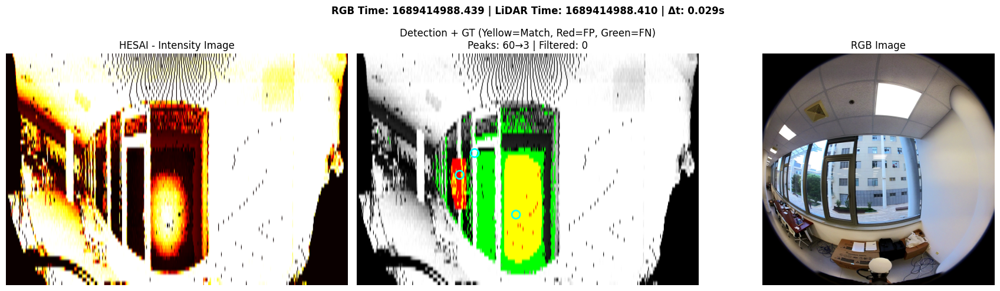


RGB Timestamp: 1689414988.439 | Sensor: OUSTER


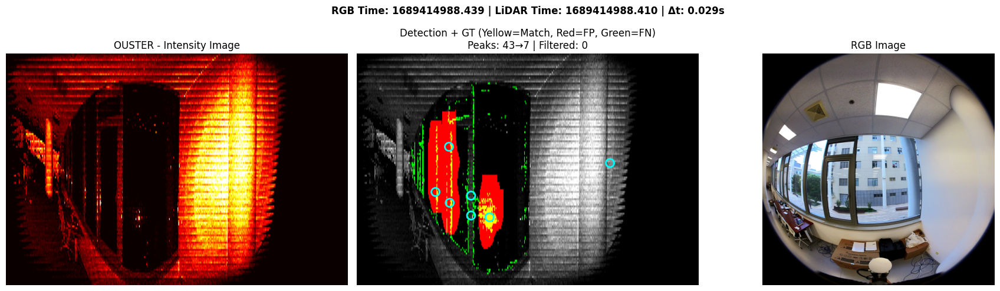


RGB Timestamp: 1689414997.397 | Sensor: HESAI


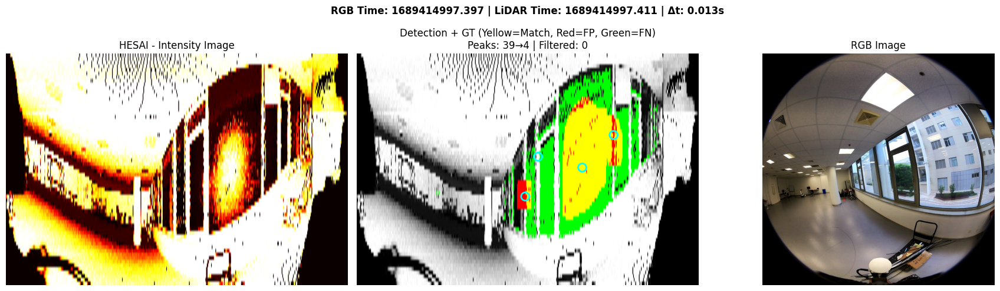


RGB Timestamp: 1689414997.397 | Sensor: OUSTER


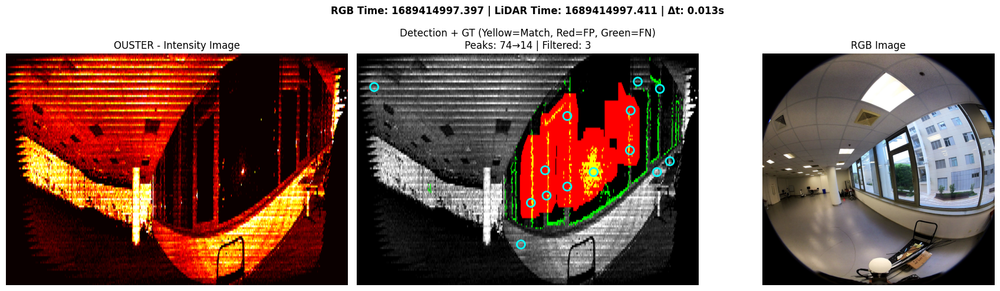


RGB Timestamp: 1689415245.397 | Sensor: HESAI


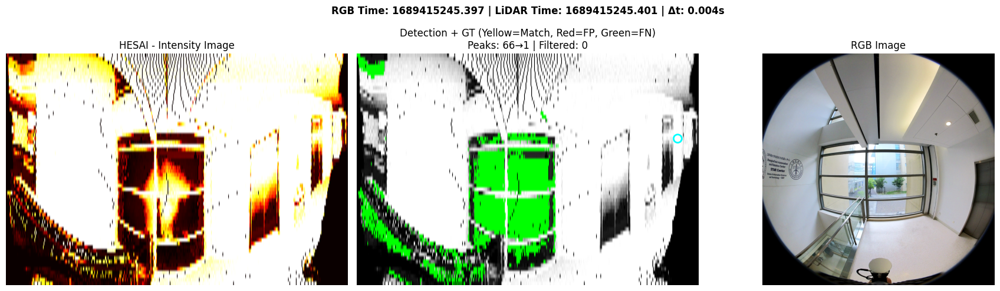


RGB Timestamp: 1689415245.397 | Sensor: OUSTER


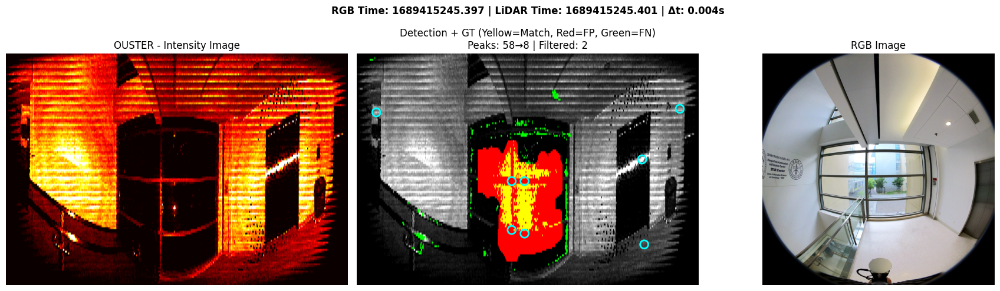


RGB Timestamp: 1689415345.522 | Sensor: HESAI


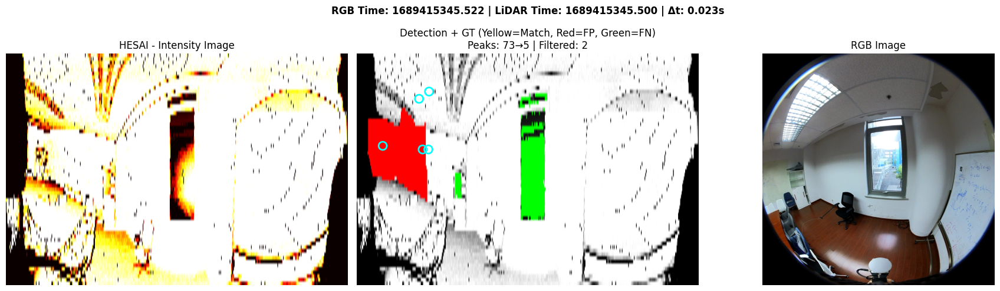


RGB Timestamp: 1689415345.522 | Sensor: OUSTER


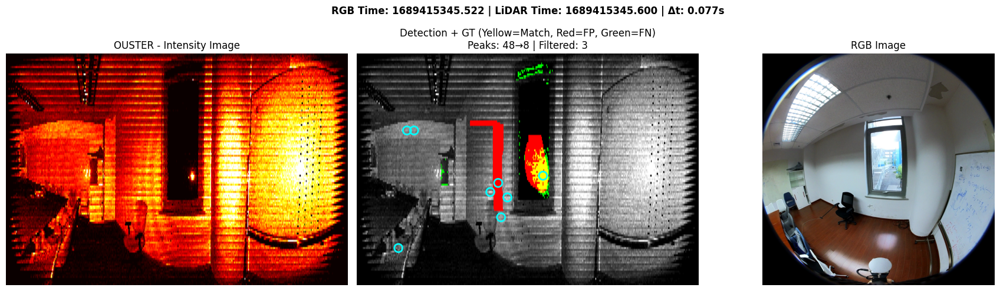


RGB Timestamp: 1689415517.272 | Sensor: HESAI


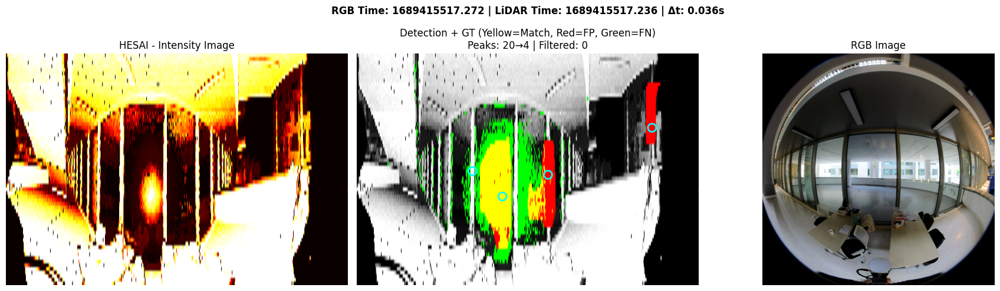


RGB Timestamp: 1689415517.272 | Sensor: OUSTER


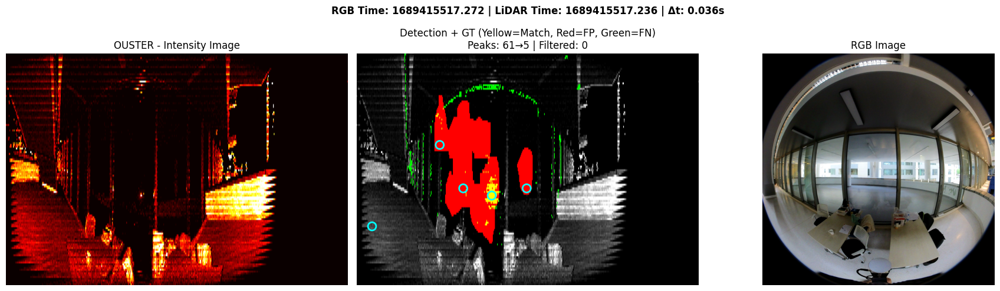


RGB Timestamp: 1689415553.814 | Sensor: HESAI


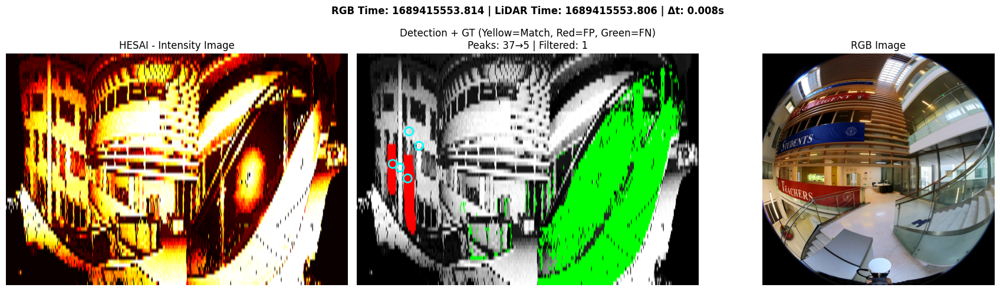


RGB Timestamp: 1689415553.814 | Sensor: OUSTER


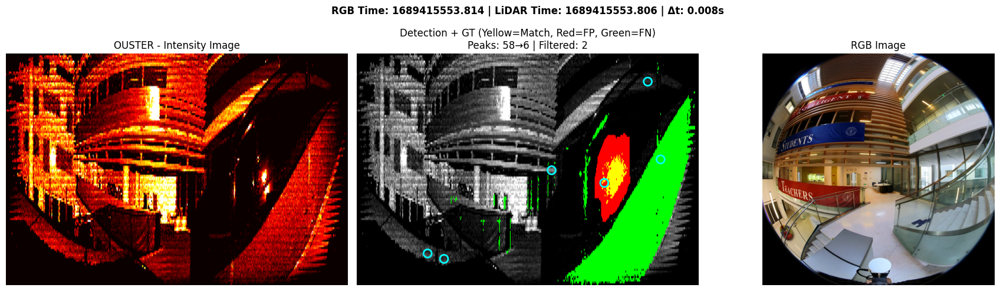


Processing complete!


In [50]:
# Initialize
loader = DataLoader(DATA_FOLDER, img_config)
img_creator = IntensityImageCreator(img_config)
detector = GlassDetector(det_config)
aligner = GravityAligner(align_config)

# Load all data
print("Loading data (RGB timestamps as reference)...")
all_data = loader.load_all_by_rgb()

if not all_data:
    print("No data loaded!")
else:
    # Estimate global gravity alignment from first timestamp
    first_ts = sorted(all_data.keys())[0]
    first_pcs = list(all_data[first_ts]['point_clouds'].values())
    
    print(f"\nEstimating gravity alignment from timestamp {first_ts}...")
    plane, fitness = aligner.estimate_ground_plane(first_pcs)
    if plane is not None:
        print(f"Ground Plane: {plane[0]:.3f}x + {plane[1]:.3f}y + {plane[2]:.3f}z + {plane[3]:.3f} = 0")
        print(f"Fitness: {fitness:.3f}")
        R_gravity = aligner.compute_gravity_rotation(plane)
        print(f"Gravity rotation computed.\n")
    else:
        print("Warning: Ground plane estimation failed, using identity rotation.")
        R_gravity = np.eye(3)
    
    # Apply gravity alignment to all point clouds
    for ts, dataset in all_data.items():
        pcs = list(dataset['point_clouds'].values())
        aligner.align_point_clouds(pcs, R_gravity)
    
    print("="*80)
    print("Running glass detection on gravity-aligned data...")
    print("="*80)
    
    # Process each timestamp
    for rgb_ts in sorted(all_data.keys()):
        dataset = all_data[rgb_ts]
        rgb_img = dataset['rgb']
        
        for sensor_name, pc in dataset['point_clouds'].items():
            print(f"\n{'='*80}")
            print(f"RGB Timestamp: {rgb_ts:.3f} | Sensor: {sensor_name.upper()}")
            print(f"{'='*80}")
            
            # Create intensity image from gravity-aligned points
            intensity_img = img_creator.create(pc)
            
            # Detect glass
            glass_mask, isolated_peaks, n_peaks, n_filtered = detector.detect(intensity_img)
            
            # Create ground truth
            gt_mask = create_ground_truth(intensity_img, pc)
            
            # Visualize
            visualize_results(
                rgb_timestamp=rgb_ts,
                sensor=sensor_name,
                lidar_timestamp=pc.timestamp,
                img=intensity_img,
                detected=glass_mask,
                gt=gt_mask,
                isolated_peaks=isolated_peaks,
                rgb=rgb_img,
                n_peaks=n_peaks,
                n_filtered=n_filtered
            )
    
    print(f"\n{'='*80}")
    print("Processing complete!")
    print(f"{'='*80}")